# Introduction

Imbalanced classification occurs when there are many more of one class than another class. Majority classes make up most of the examples and minority classes make up a smaller portion of the examples. When class imbalance happens because of an error during data collection it is best to go back and fix the error. 

In other cases where the the minority percentage is part of the real distribution then we may need to take special measures to account for the skewed distribution. Example of real life imbalanced classes include

 - Fraud detection
 - Claim prediction
 - Default prediction
 - Churn prediction
 - Spam detection
 - Anomaly detection
 - Oulier detection
 - Intrusion detection
 - Conversion prediction
 - Certain types of disease detection

# Establish that an impalance exists

Plot the data to understand the distribution of classes. We'll use breast cancer data from https://www.kaggle.com/datasets/yasserh/breast-cancer-dataset 

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
 
df = pd.read_csv('breast-cancer.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [2]:
print(df.columns)

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')


<Axes: title={'center': 'Diagnosis'}>

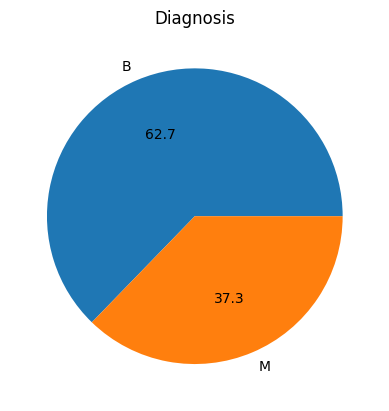

In [3]:
df.groupby('diagnosis').size().plot(kind='pie', autopct='%.1f', title="Diagnosis")

The benign (no cancer) class out numbers the malignant (cancer) class by a ratio of ~ 1.7:1. There is a slight imbalance which is well below the upper bound of a 90:1 ratio recommended by some practioners for using common techniques. <source>

We'll perform the following steps

- Visualize data to see if there is a simple partitioning criteria
- Establish baseline performance metrics
- Evaluate making no changes to the class balance
- Evaluate undersampling of the majority class
- Evaluate oversampling of the minority class
- Evaluate ensemble models
- Compare all approaches

# Visualize groupings in pair plots

We want to see if there is a clear way to divide the classes before diving deeper.

We'll compare all of the means, SE and worst case measures. If a clear way to always differentiate between the classes emerges we won't need to address the imbalance because a simple classifier will suffice.

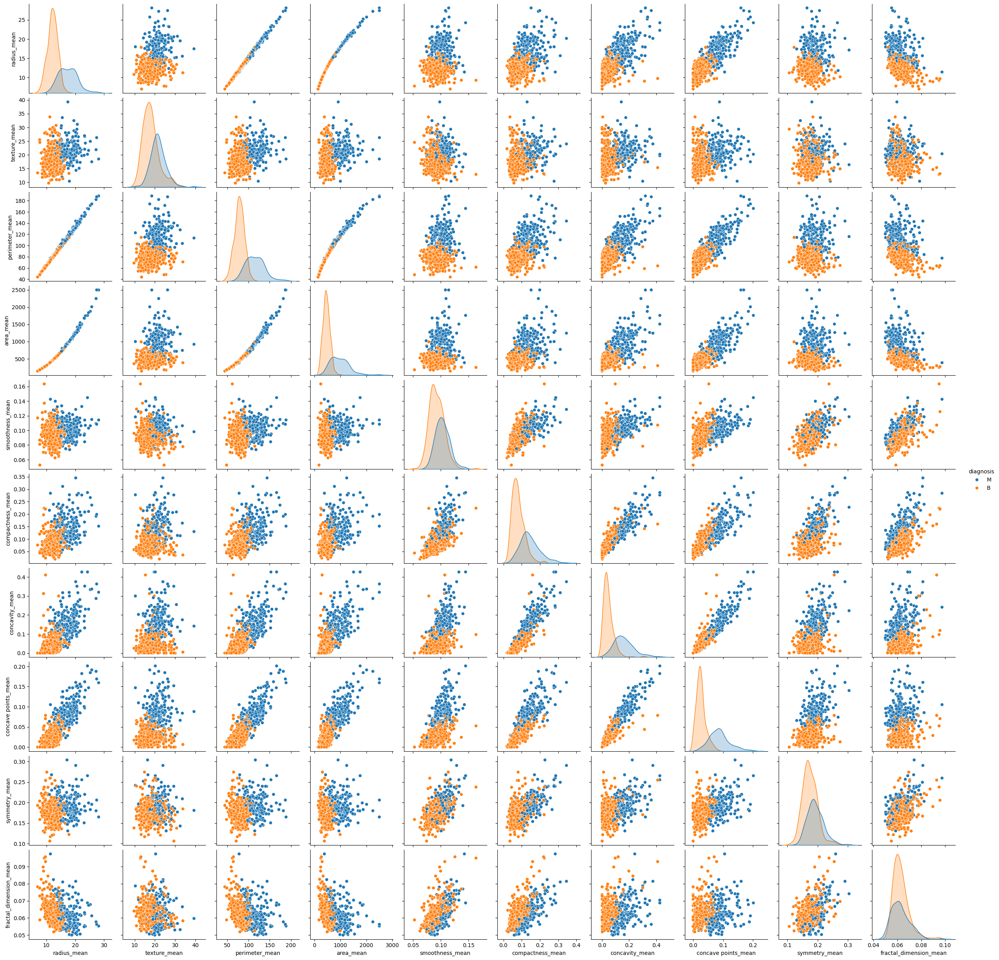

In [4]:
sns.pairplot(df, hue="diagnosis", vars=['radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean'])

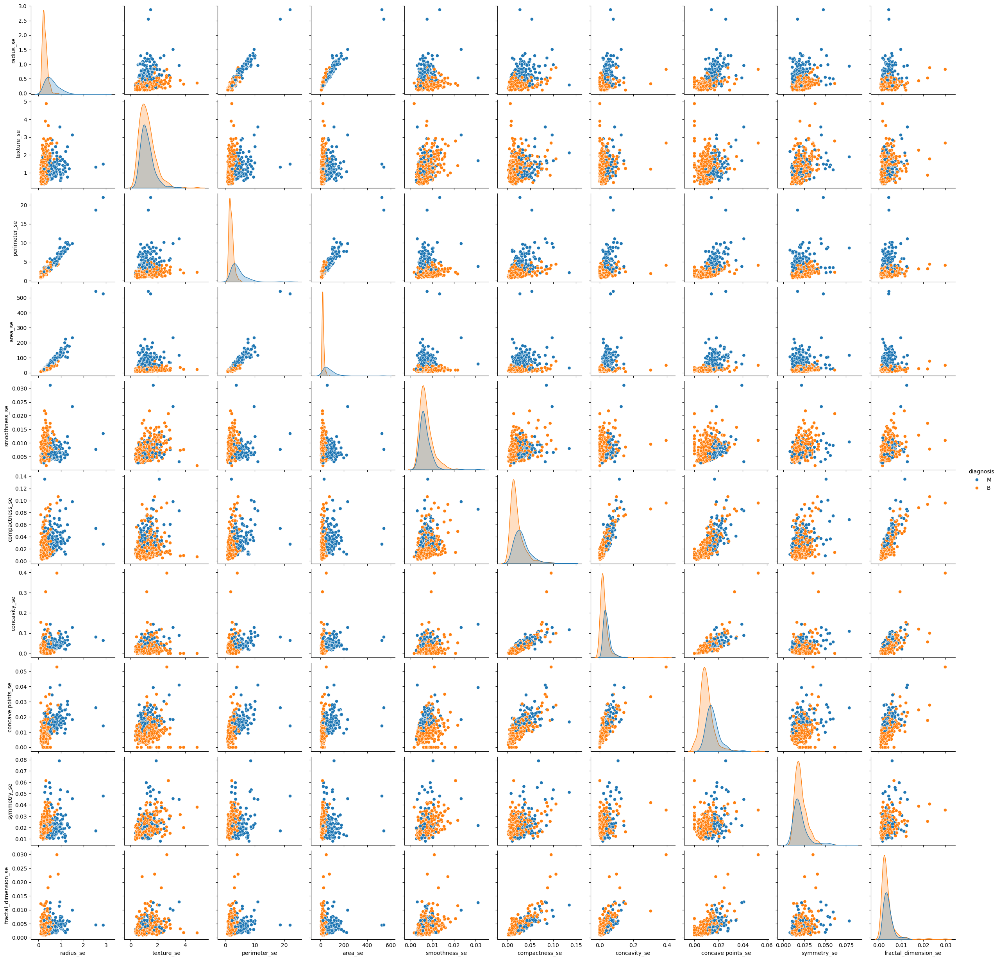

In [5]:
sns.pairplot(df, hue="diagnosis", vars=['radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se'])

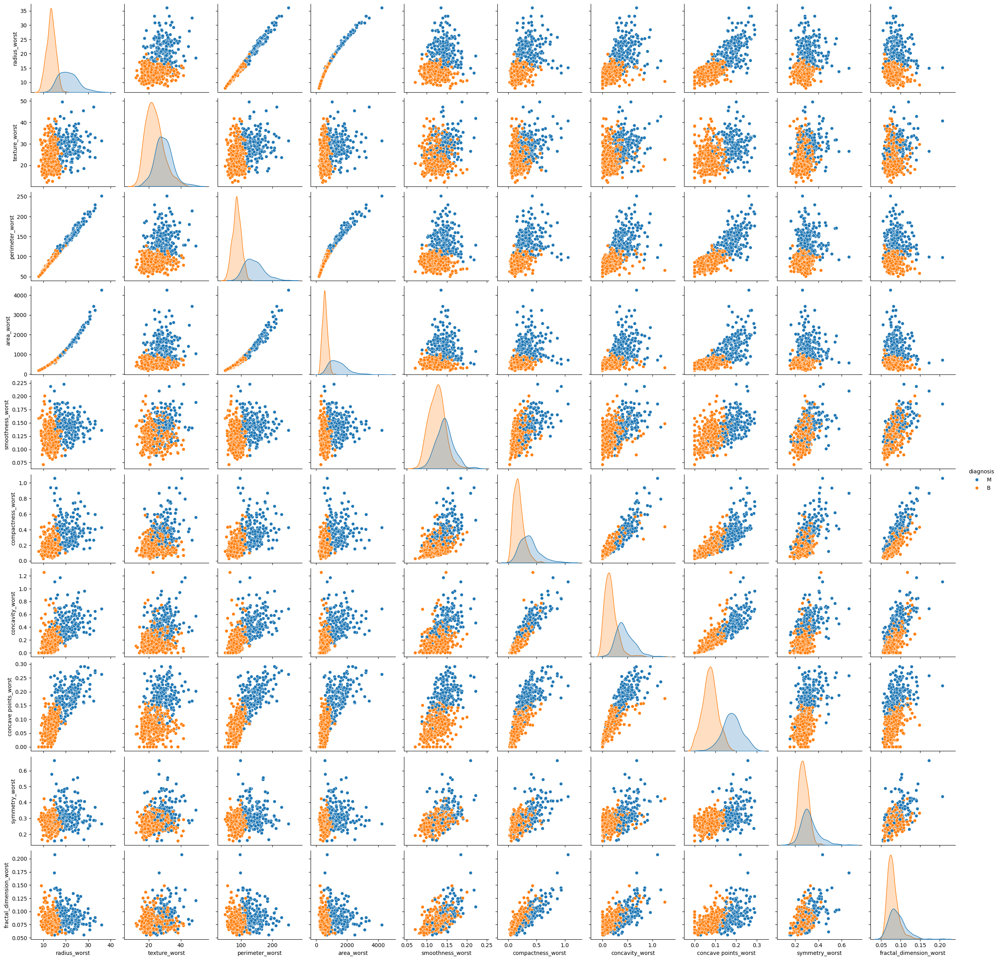

In [6]:
sns.pairplot(df, hue="diagnosis", vars=['radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'])

While there is evidence that there are regions in the dataset where a sample is clearly benign and malignant, there are numerous areas of overlap where the grouping is ambigious. We'll want to use different modeling approaches to draw out a more nuanced approach.

Since this data deals with disease detection, the consequences of false positives (suggesting a severe condition when there is none) and false negatives (failing to capture a severe condition when early treatment is essential) the model will need to graded on more factors than accuracy alone. Other factors such as precision and recall will need to be considered. 

We can observe that some of the variable distribution plots have more separation between classes. We start by focusing on these variables because they have the most promise for finding groupings with simpler techniques. The variables we'll focus on include:

 - radius_mean
 - perimeter_mean
 - area_mean
 - concavity_mean
 - concave_points_mean
 - radius_worst
 - perimeter_worst
 - area_worst
 - concavity_worst
 - concave_points_worst

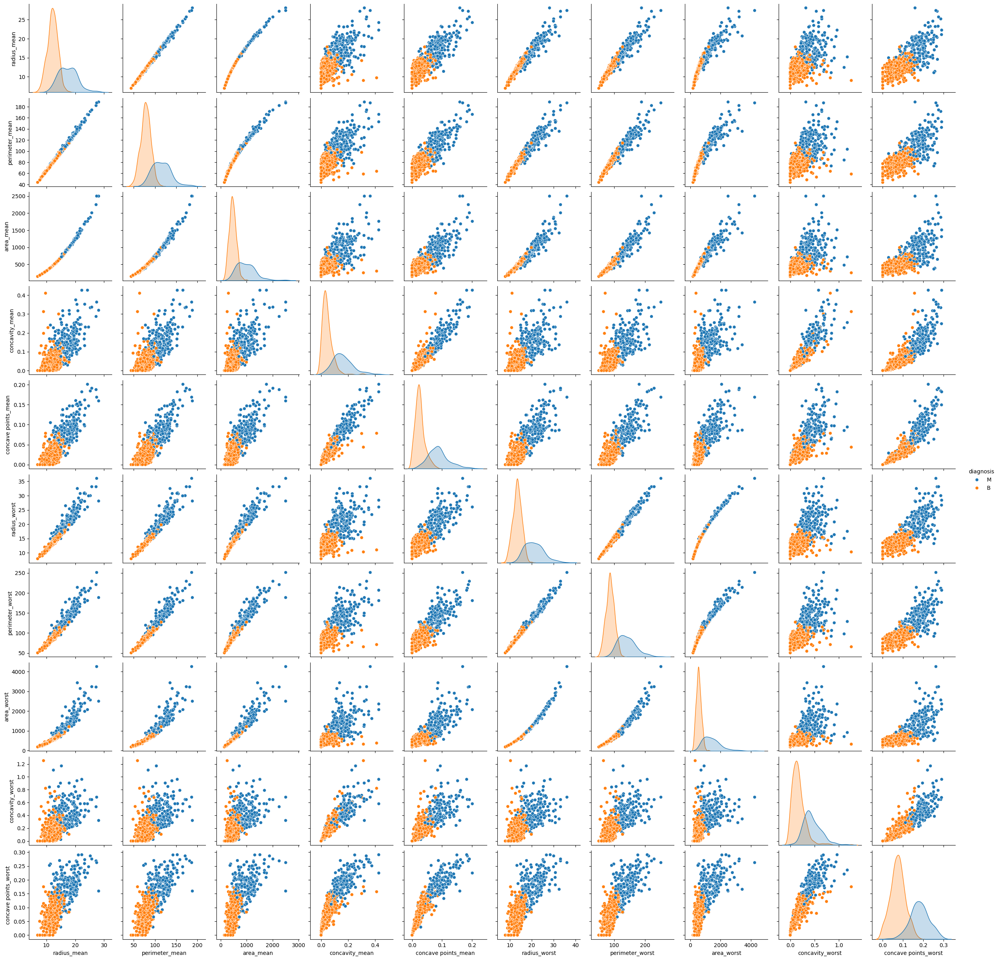

In [7]:
# Form a data frame with just the variables that have high separation between classes

reduced_df = df[["radius_mean", "perimeter_mean", "area_mean", "concavity_mean", 
                 "concave points_mean", "radius_worst", "perimeter_worst", 
                 "area_worst", "concavity_worst", "concave points_worst", "diagnosis"]].copy(deep = True)
sns.pairplot(reduced_df, hue="diagnosis")

The results of the reduced data frame have stronger separation between classes, but we should keep searching for a better model. Let's prepare the data for further experiments.

In [8]:
from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

diagnosis_encoder = LabelEncoder()

# Transform diagnosis labels to number
reduced_df["diagnosis_code"] = diagnosis_encoder.fit_transform(reduced_df["diagnosis"])
print(f"diagnosis classes: {diagnosis_encoder.classes_}")

# We use a standard scaler approach to normalize all input variables
X = reduced_df.drop(columns=["diagnosis", "diagnosis_code"])
X_columns = X.columns
X_scaler = StandardScaler()
X_scaled_features = X_scaler.fit_transform(X.values)
X = pd.DataFrame(X_scaled_features, index=reduced_df.index, columns=X_columns)

display(X.head())

y = reduced_df[["diagnosis_code"]]

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

diagnosis classes: ['B' 'M']


,radius_mean,perimeter_mean,area_mean,concavity_mean,concave points_mean,radius_worst,perimeter_worst,area_worst,concavity_worst,concave points_worst
0,1.097064,1.269934,0.984375,2.652874,2.532475,1.886690,2.303601,2.001237,2.109526,2.296076
1,1.829821,1.685955,1.908708,-0.023846,0.548144,1.805927,1.535126,1.890489,-0.146749,1.087084
2,1.579888,1.566503,1.558884,1.363478,2.037231,1.511870,1.347475,1.456285,0.854974,1.955000
3,-0.768909,-0.592687,-0.764464,1.915897,1.451707,-0.281464,-0.249939,-0.550021,1.989588,2.175786
4,1.750297,1.776573,1.826229,1.371011,1.428493,1.298575,1.338539,1.220724,0.613179,0.729259


X shape: (569, 10)
y shape: (569, 1)


# Baseline Performance Metrics

## The all malignant model

A model that simply responded malignant for all data points would have 37.3% accuracy rate and scare 62.7% of the patients who had no cancer activity. We can say this model has the worst outcome for mental well-being.

## The all benign model

A model that simply responded benign for all data points would have a 62.7% accuracy rate and would not provide any diagnostic benefit to the 37.3% of people with cancer. We can say this model has the worst outcome for long term patient health.

## Reference metrics

We'll use constant response models as a starting point for understanding our performance metrics for various approaches discussed in this notebook.

In [9]:
import torch.nn as nn

class AllMalignant(nn.Module):
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()

    def forward(self, x):
        return torch.Tensor([1])

class AllBenign(nn.Module):
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()

    def forward(self, x):
        return torch.Tensor([0])

In [10]:
# Format Confusion matrix. Credit: https://github.com/DTrimarchi10/confusion_matrix/blob/master/cf_matrix.py

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def make_confusion_matrix(cf,
                          group_names=None,
                          categories='auto',
                          count=True,
                          percent=True,
                          cbar=True,
                          xyticks=True,
                          xyplotlabels=True,
                          sum_stats=True,
                          figsize=None,
                          cmap='Blues',
                          title=None):
    '''
    This function will make a pretty plot of an sklearn Confusion Matrix cm using a Seaborn heatmap visualization.

    Arguments
    ---------
    cf:            confusion matrix to be passed in

    group_names:   List of strings that represent the labels row by row to be shown in each square.

    categories:    List of strings containing the categories to be displayed on the x,y axis. Default is 'auto'

    count:         If True, show the raw number in the confusion matrix. Default is True.

    normalize:     If True, show the proportions for each category. Default is True.

    cbar:          If True, show the color bar. The cbar values are based off the values in the confusion matrix.
                   Default is True.

    xyticks:       If True, show x and y ticks. Default is True.

    xyplotlabels:  If True, show 'True Label' and 'Predicted Label' on the figure. Default is True.

    sum_stats:     If True, display summary statistics below the figure. Default is True.

    figsize:       Tuple representing the figure size. Default will be the matplotlib rcParams value.

    cmap:          Colormap of the values displayed from matplotlib.pyplot.cm. Default is 'Blues'
                   See http://matplotlib.org/examples/color/colormaps_reference.html
                   
    title:         Title for the heatmap. Default is None.

    '''
    # CODE TO GENERATE TEXT INSIDE EACH SQUARE
    blanks = ['' for i in range(cf.size)]

    if group_names and len(group_names)==cf.size:
        group_labels = ["{}\n".format(value) for value in group_names]
    else:
        group_labels = blanks

    if count:
        group_counts = ["{0:0.0f}\n".format(value) for value in cf.flatten()]
    else:
        group_counts = blanks

    if percent:
        group_percentages = ["{0:.2%}".format(value) for value in cf.flatten()/np.sum(cf)]
    else:
        group_percentages = blanks

    box_labels = [f"{v1}{v2}{v3}".strip() for v1, v2, v3 in zip(group_labels,group_counts,group_percentages)]
    box_labels = np.asarray(box_labels).reshape(cf.shape[0],cf.shape[1])


    # CODE TO GENERATE SUMMARY STATISTICS & TEXT FOR SUMMARY STATS
    if sum_stats:
        #Accuracy is sum of diagonal divided by total observations
        accuracy  = np.trace(cf) / float(np.sum(cf))

        #if it is a binary confusion matrix, show some more stats
        if len(cf)==2:
            #Metrics for Binary Confusion Matrices
            precision = cf[1,1] / sum(cf[:,1])
            recall    = cf[1,1] / sum(cf[1,:])
            f1_score  = 2*precision*recall / (precision + recall)
            stats_text = "\n\nAccuracy={:0.3f}\nPrecision={:0.3f}\nRecall={:0.3f}\nF1 Score={:0.3f}".format(
                accuracy,precision,recall,f1_score)
        else:
            stats_text = "\n\nAccuracy={:0.3f}".format(accuracy)
    else:
        stats_text = ""


    # SET FIGURE PARAMETERS ACCORDING TO OTHER ARGUMENTS
    if figsize==None:
        #Get default figure size if not set
        figsize = plt.rcParams.get('figure.figsize')

    if xyticks==False:
        #Do not show categories if xyticks is False
        categories=False


    # MAKE THE HEATMAP VISUALIZATION
    plt.figure(figsize=figsize)
    sns.heatmap(cf,annot=box_labels,fmt="",cmap=cmap,cbar=cbar,xticklabels=categories,yticklabels=categories)

    if xyplotlabels:
        plt.ylabel('True label')
        plt.xlabel('Predicted label' + stats_text)
    else:
        plt.xlabel(stats_text)
    
    if title:
        plt.title(title)

None

C:\Users\ccoza\AppData\Local\Temp\ipykernel_11480\3791674760.py:81: RuntimeWarning: invalid value encountered in scalar divide
  precision = cf[1,1] / sum(cf[:,1])


None

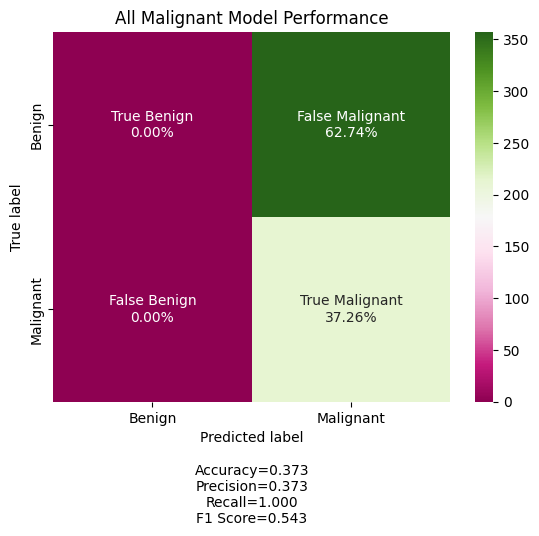

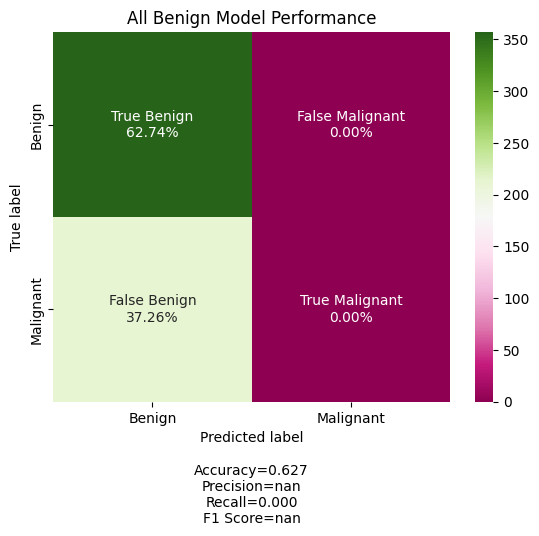

In [11]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import numpy as np
import torch

am_model = AllMalignant()
ab_model = AllBenign()
predicted_am = []
predicted_ab = []

inputs = X.to_numpy()

for values in inputs:
    tensor = torch.Tensor(values)
    am_prediction = am_model(tensor);
    ab_prediction = ab_model(tensor)
    predicted_am.append(am_prediction.item())
    predicted_ab.append(ab_prediction.item())

am_metrics = confusion_matrix(y, predicted_am)
ab_metrics = confusion_matrix(y, predicted_ab)

labels = ["True Benign","False Malignant","False Benign","True Malignant"]
categories = ["Benign", "Malignant"]
display(make_confusion_matrix(am_metrics, group_names=labels, categories=categories, title="All Malignant Model Performance", cmap="PiYG", count=False))
display(make_confusion_matrix(ab_metrics, group_names=labels, categories=categories, title="All Benign Model Performance", cmap="PiYG", count=False))

# The model

For our model we'll use the same model for all of our experiments for better comparisons from a data perspective. We'll have linear nodes on the inputs feeding into a number of hidden layers to produce the final answer.

In [12]:
import torch
import torch.nn

device = "cpu"
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"

class BreastCancerDiagnosis(nn.Module):
    def __init__(self):
        super().__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(10, 25),
            nn.ReLU(),
            nn.Linear(25, 25),
            nn.ReLU(),
            nn.Linear(25, 1)
        )
    
    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

model = BreastCancerDiagnosis().to(device)
print(model)

loss_fn = nn.BCEWithLogitsLoss()
optimizer = torch.optim.SGD(params=model.parameters(), lr=0.1)

def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X_train,y_train) in enumerate(dataloader):
        X_train, y_train = X_train.to(device), y_train.to(device)

        # Compute prediction error
        pred = model(X_train)
        loss = loss_fn(pred, y_train)

        #Back propagation
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        if batch % 10 == 0:
            loss, current = loss.item(), (batch + 1) * len(X_test)
            print(f"loss: {loss:>7f} [{current:>5d}/{size:>5d}]")

def test(dataloader, model, loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for X_test, y_test in dataloader:
            X_test, y_test = X_test.to(device), y_test.to(device)
            pred = model(X_test)
            test_loss += loss_fn(pred, y_test).item()
            correct += (pred.argmax(1) == y_test).type(torch.float).sum().item()
    test_loss /= num_batches
    correct /= size
    print(f"Test Error: \nAccuracy: {(100*correct):>0.1f}%, Avg loss: {test_loss:>8f} \n")

BreastCancerDiagnosis(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=10, out_features=25, bias=True)
    (1): ReLU()
    (2): Linear(in_features=25, out_features=25, bias=True)
    (3): ReLU()
    (4): Linear(in_features=25, out_features=1, bias=True)
  )
)


# No changes to distribution

We'll start our experiments by making no changes to the distribution. We'll make sure the training and validation datasets have the same distribution as the original dataset.

Process:

 1. Split the y values into each class
 2. Split each class into train and test
 3. Concatenate the train datasets for each class, then combine the test datasets
 4. Use the indexes to split the X values into train and test
 5. Train the model  

In [16]:
random_seed = 567

# Split y values into each class
y_benign = y[y["diagnosis_code"] == 0]
y_malignant = y[y["diagnosis_code"] == 1]

# 70/30 split of benign class
y_benign_train = y_benign.sample(frac = 0.7, random_state = random_seed)
y_benign_test = y_benign.drop(y_benign_train.index)

# 70/30 split of malignant class
y_malignant_train = y_malignant.sample(frac = 0.7, random_state = random_seed)
y_malignant_test = y_malignant.drop(y_malignant_train.index)

# Concatenate the train and test datasets for each class
y_train = pd.concat([y_benign_train, y_malignant_train])
y_test = pd.concat([y_benign_test, y_malignant_test])

# 70/30 split of the X values
X_train = X.drop(y_test.index)
X_test = X.drop(y_train.index)

print(f"y_train count: {len(y_train)}, X_train count: {len(X_train)}")
print(f"y_test count: {len(y_test)}, X_test count: {len(X_test)}")

y_train count: 398, X_train count: 398
y_test count: 171, X_test count: 171


In [24]:
display(y_train.groupby('diagnosis_code').size())

diagnosis_code
0    250
1    148
dtype: int64

In [25]:
display(y_test.groupby('diagnosis_code').size())

diagnosis_code
0    107
1     64
dtype: int64

# Under sample

We'll sample less of the majority class so we have an equal amount of each class



In [26]:
y_benign_undersample = y_benign.sample(n = len(y_malignant.index), random_state = random_seed)

y_undersample = pd.concat([y_benign_undersample, y_malignant])

print(f"Using {len(y_undersample)} data points out of a possible {len(y)} data points")
display(y_undersample.groupby('diagnosis_code').size())

Using 424 data points out of a possible 569 data points


diagnosis_code
0    212
1    212
dtype: int64

# Over sample

We'll copy portions of the minority class until we have an equal amount of each class

In [27]:
# For larger class differences we may have to take repeated samples
y_malignant_sample = y_malignant.sample(n = len(y_benign.index) - len(y_malignant.index), random_state = random_seed)

y_oversample = pd.concat([y_malignant, y_malignant_sample, y_benign])

print(f"Repeated an additional {len(y_malignant_sample)} malignant data points")
print(f"Using {len(y_oversample)} data points out of a possible {len(y)} data points")
display(y_oversample.groupby('diagnosis_code').size())

Repeated an additional 145 malignant data points
Using 714 data points out of a possible 569 data points


diagnosis_code
0    357
1    357
dtype: int64